In [ ]:
#1
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

from google.colab import drive
drive.mount('/content/drive',force_remount=True)

imgpath1 = '/content/drive/My Drive/Colab Notebooks/Computer Vision/img/book1.jpg'
img1_orig = cv.imread(imgpath1)
img1 = cv.cvtColor(img1_orig, cv.COLOR_BGR2RGB)

imgpath2 = '/content/drive/My Drive/Colab Notebooks/Computer Vision/img/book2.jpg'
img2_orig = cv.imread(imgpath2)
img2 = cv.cvtColor(img2_orig, cv.COLOR_BGR2RGB)

Mounted at /content/drive


In [ ]:
def draw_compare(img, new_img, name):
  height, width = img.shape[:2]
  k = width / height
  fwidth = 8
  fheight = fwidth / k
  plt.figure(figsize=(fwidth, fheight))
  plt.subplot(1, 2, 1)
  if len(img.shape) == 2:  # grayscale
    plt.imshow(img, cmap='gray')
  else:
    plt.imshow(img)
  plt.title('Original')
  plt.axis('off')
  plt.subplot(1, 2, 2)
  if len(new_img.shape) == 2:  # grayscale
    plt.imshow(new_img, cmap='gray')
  else:
    plt.imshow(new_img)
  plt.title(name)
  plt.axis('off')
  plt.tight_layout()
  plt.show()

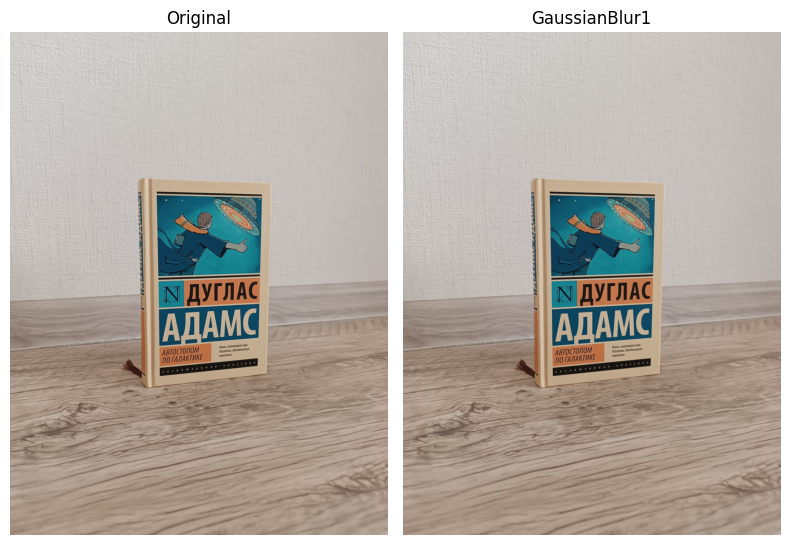

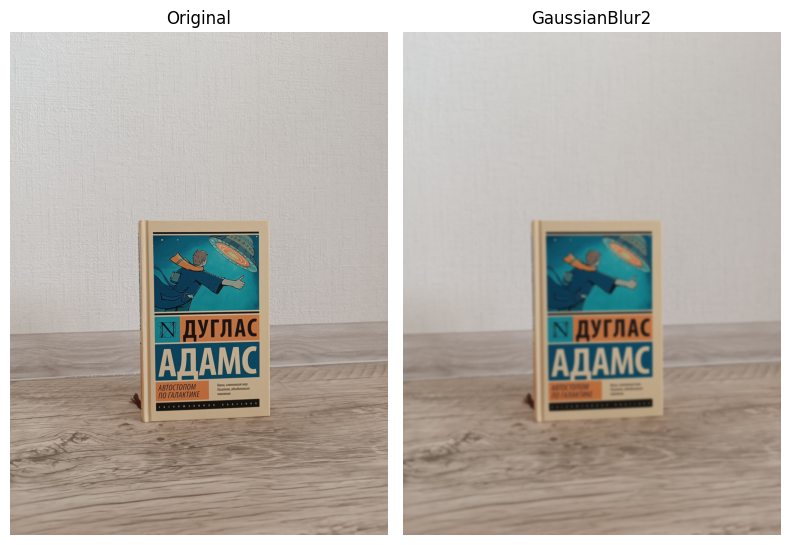

In [ ]:
#2.1
gaussian1 = cv.GaussianBlur(img1, (5, 5), 0)
gaussian2 = cv.GaussianBlur(img2, (51, 51), 0)

draw_compare(img1, gaussian1, 'GaussianBlur1')
draw_compare(img2, gaussian2, 'GaussianBlur2')

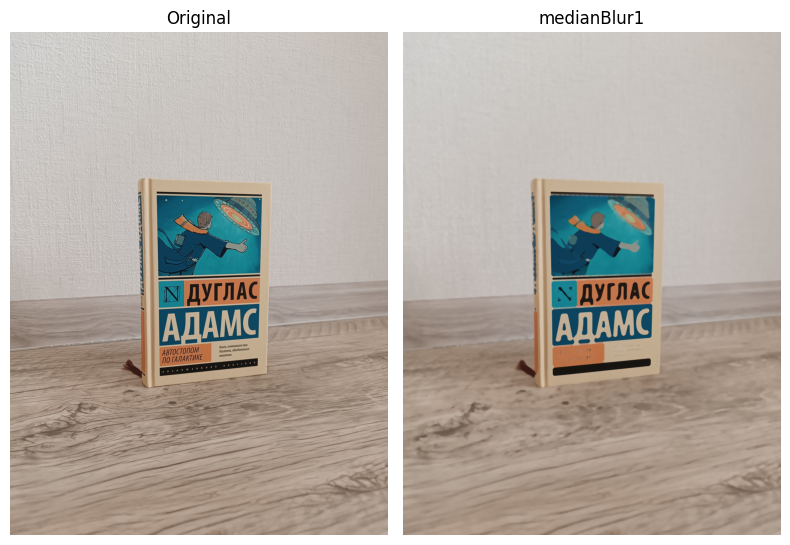

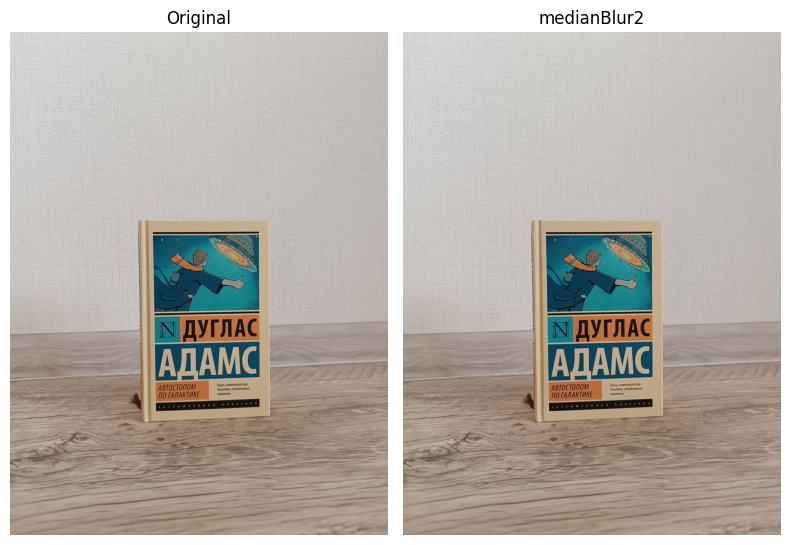

In [ ]:
#2.2
median1 = cv.medianBlur(img1, 25)
median2 = cv.medianBlur(img2, 5)

draw_compare(img1, median1, 'medianBlur1')
draw_compare(img2, median2, 'medianBlur2')

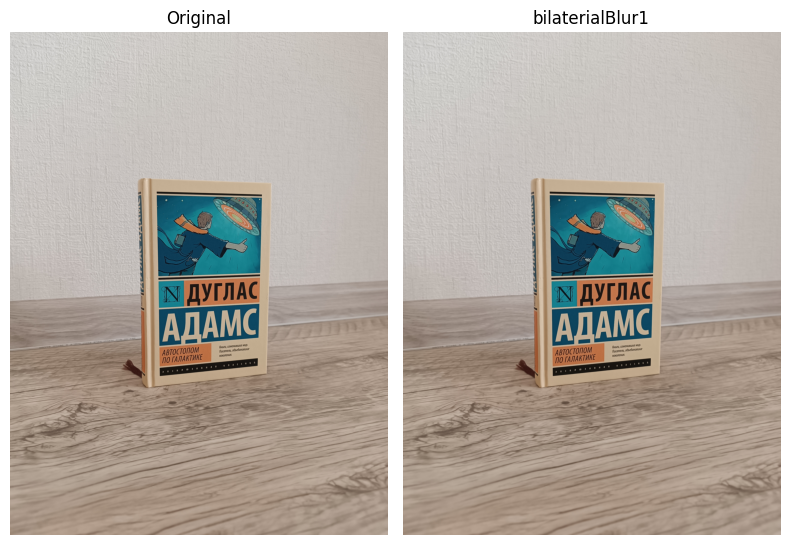

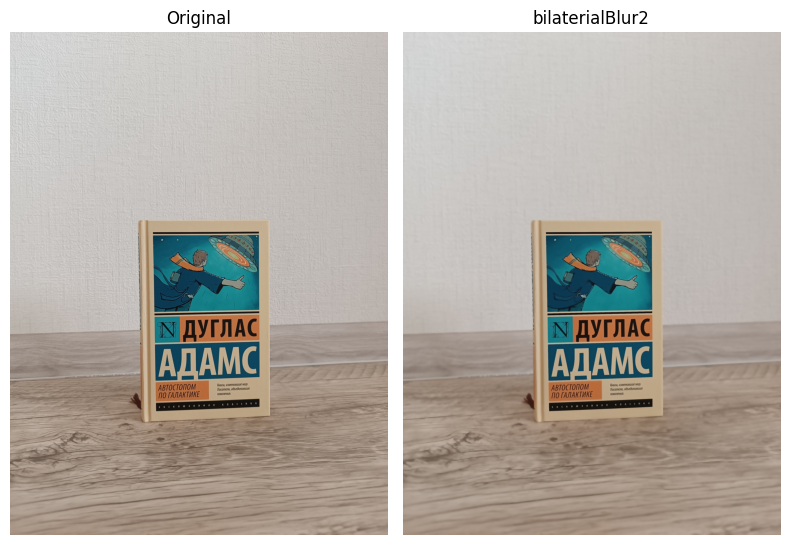

In [ ]:
#2.3
bilaterial1 = cv.bilateralFilter(img1,9,75,75)
bilaterial2 = cv.bilateralFilter(img2, 25, 100, 50)

draw_compare(img1, bilaterial1, 'bilaterialBlur1')
draw_compare(img2, bilaterial2, 'bilaterialBlur2')

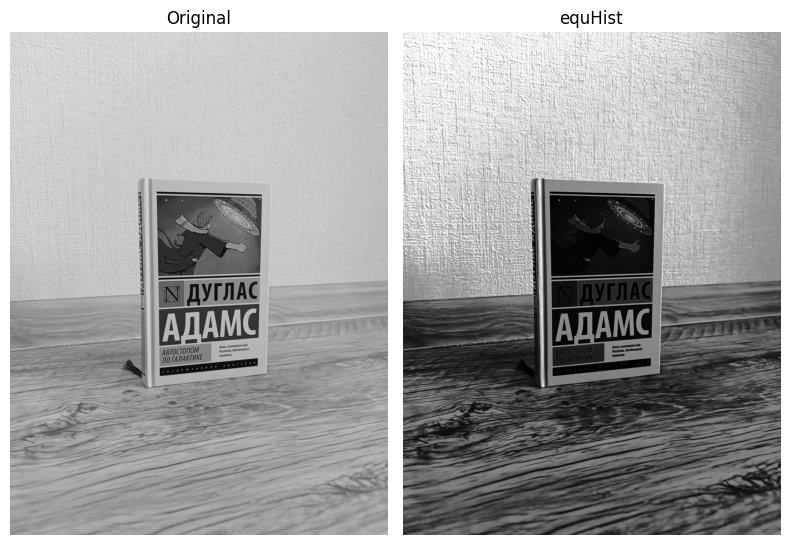

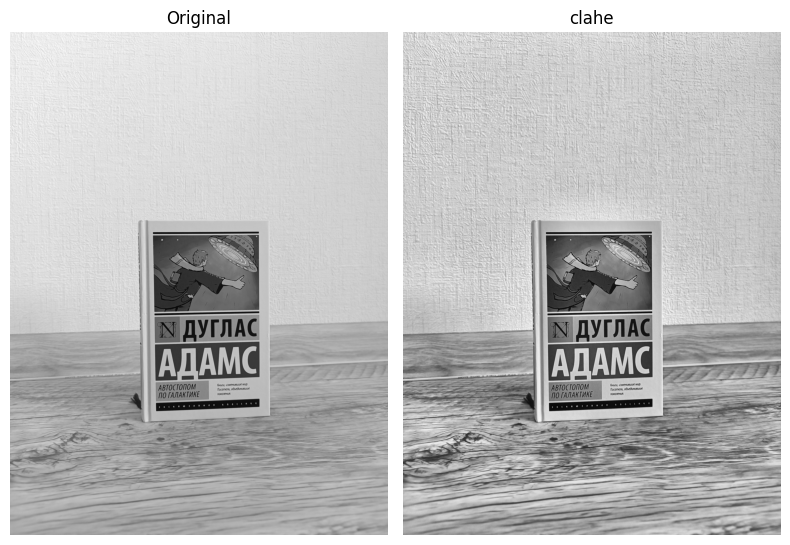

In [ ]:
#3
gray1 = cv.cvtColor(gaussian1, cv.COLOR_RGB2GRAY)
gray2 = cv.cvtColor(median2, cv.COLOR_RGB2GRAY)

hist1 = cv.equalizeHist(gray1)
draw_compare(gray1, hist1, 'equHist')

clahe = cv.createCLAHE (clipLimit=2.0, tileGridSize=(8,8))
hist2 = clahe.apply(gray2)
draw_compare(gray2, hist2, 'clahe')

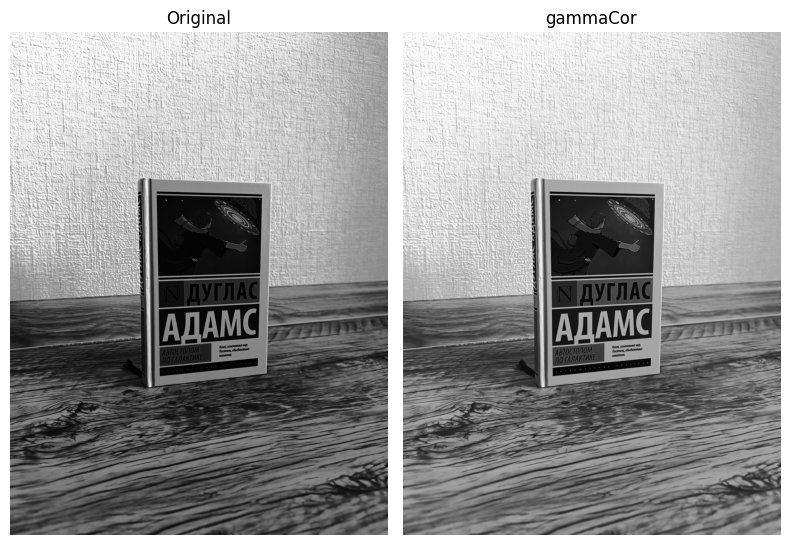

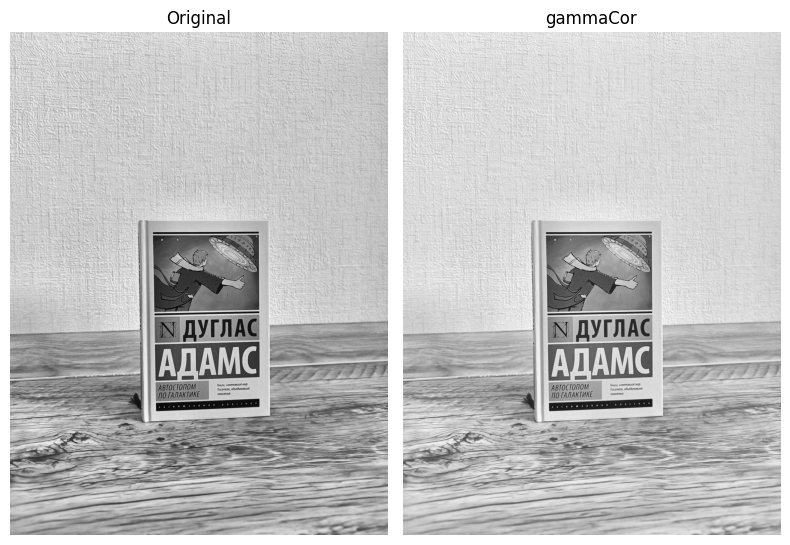

In [ ]:
#4
def adjust_gamma(img, gamma = 1.5):
  inv_gamma = 1.0 / gamma
  table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
  return cv.LUT(img, table)

gamma1 = adjust_gamma(hist1)
gamma2 = adjust_gamma(hist2)

draw_compare(hist1, gamma1, 'gammaCor')
draw_compare(hist2, gamma2, 'gammaCor')

Пути к изображениям:
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess1.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess2.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess3.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess4.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess5.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess6.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess7.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess8.jpg
/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess9.jpg
Углы найдены на изображении: /content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess1.jpg
Углы найдены на изображении: /content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess2.jpg
Углы найдены на изображении: /content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess3.jpg
Углы найдены на изображении: /content/dr

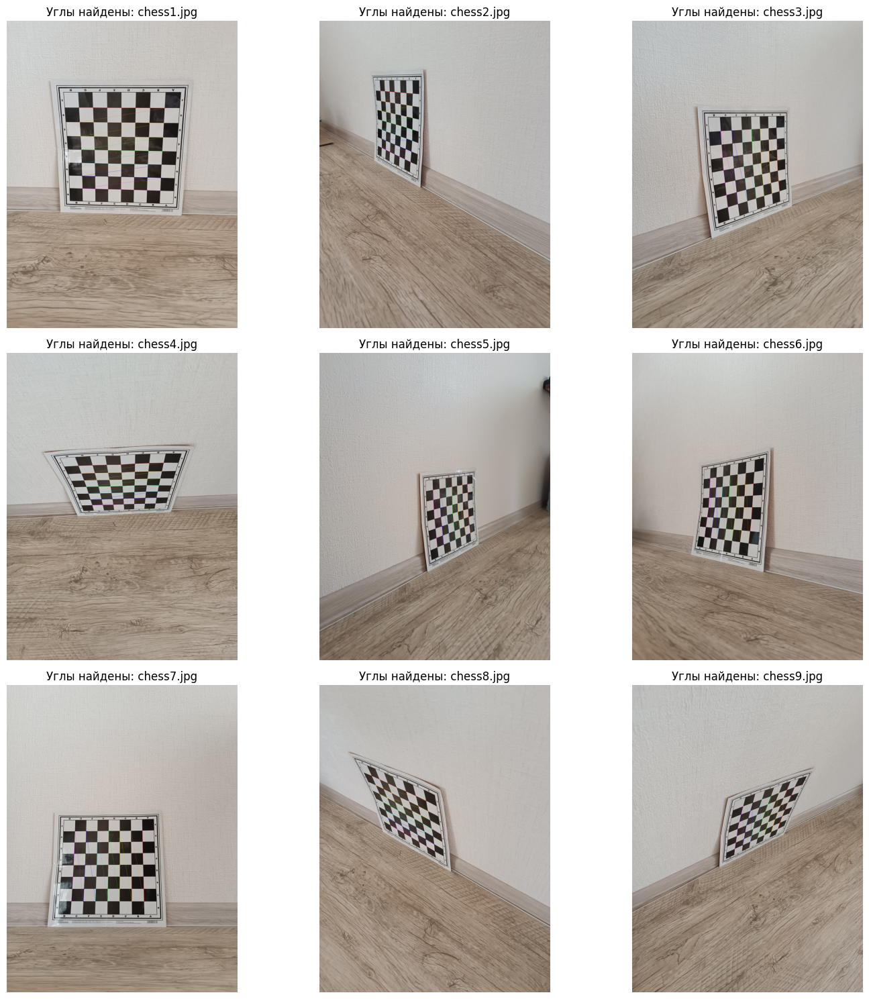

Успешно обработано изображений: 9/9
Матрица камеры:
 [[3.01392297e+03 0.00000000e+00 1.37879750e+03]
 [0.00000000e+00 3.02060479e+03 2.09318606e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]

Коэффициенты дисторсии:
 [[ 0.12306793 -0.18965747  0.01755114 -0.01943601  0.78392909]]

Средняя ошибка репроекции: 4.5808 пикселей


In [ ]:
imgpaths = []
for i in range(1, 10):
    imgpaths.append(f'/content/drive/My Drive/Colab Notebooks/Computer Vision/img/chess{str(i)}.jpg')

print("Пути к изображениям:")
for path in imgpaths:
    print(path)

def calibrate_camera_8x8(image_paths, square_size=1.0):
    objp = np.zeros((7 * 7, 3), np.float32)
    objp[:, :2] = np.mgrid[0:7, 0:7].T.reshape(-1, 2)
    objp *= square_size

    objpoints = []
    imgpoints = []

    success_count = 0

    visualization_imgs = []

    for fname in image_paths:
        img = cv.imread(fname)
        if img is None:
            print(f"Не удалось загрузить изображение: {fname}")
            continue

        gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

        ret, corners = cv.findChessboardCorners(gray, (7, 7), None)

        if ret:
            objpoints.append(objp)

            criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
            corners_refined = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
            imgpoints.append(corners_refined)
            success_count += 1

            print(f"Углы найдены на изображении: {fname}")

            img_with_corners = img.copy()
            cv.drawChessboardCorners(img_with_corners, (7, 7), corners_refined, ret)
            visualization_imgs.append((fname, img_with_corners))

        else:
            print(f"Углы не найдены на изображении: {fname}")

    if visualization_imgs:
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        axes = axes.ravel()

        for idx, (fname, img) in enumerate(visualization_imgs):
            if idx < 9:
                axes[idx].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
                axes[idx].set_title(f'Углы найдены: {fname.split("/")[-1]}')
                axes[idx].axis('off')

        for idx in range(len(visualization_imgs), 9):
            axes[idx].axis('off')

        plt.tight_layout()
        plt.show()

    print(f"Успешно обработано изображений: {success_count}/{len(image_paths)}")

    if len(objpoints) == 0:
        print("Не найдено ни одного подходящего изображения для калибровки!")
        return None, None, None

    ret, camera_matrix, distortion_coeffs, rvecs, tvecs = cv.calibrateCamera(
        objpoints, imgpoints, gray.shape[::-1], None, None
    )

    return camera_matrix, distortion_coeffs, ret

camera_matrix, dist_coeffs, error = calibrate_camera_8x8(imgpaths)

if camera_matrix is not None:
    print("Матрица камеры:\n", camera_matrix)
    print("\nКоэффициенты дисторсии:\n", dist_coeffs)
    print(f"\nСредняя ошибка репроекции: {error:.4f} пикселей")
else:
    print("Калибровка не удалась!")

In [ ]:
np.save('camera_matrix.npy', camera_matrix)
np.save('dist_coeffs.npy', dist_coeffs)

print("Параметры калибровки сохранены.")

Параметры калибровки сохранены.


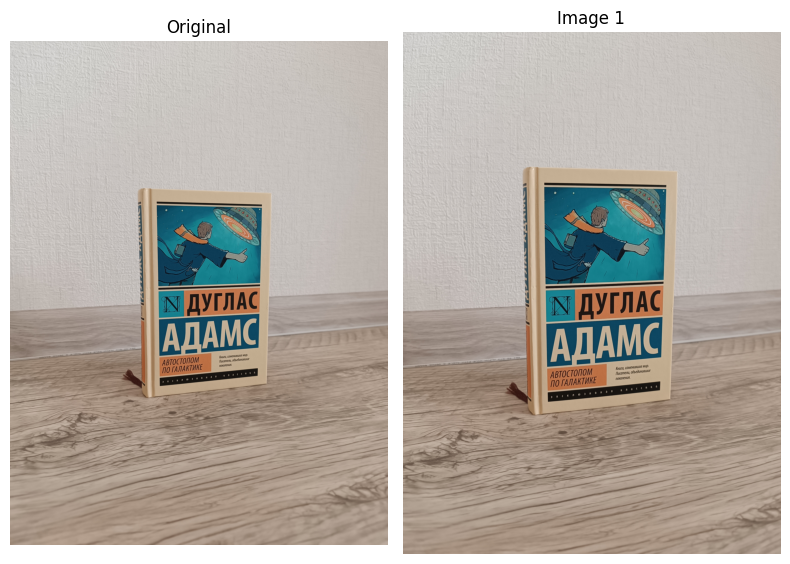

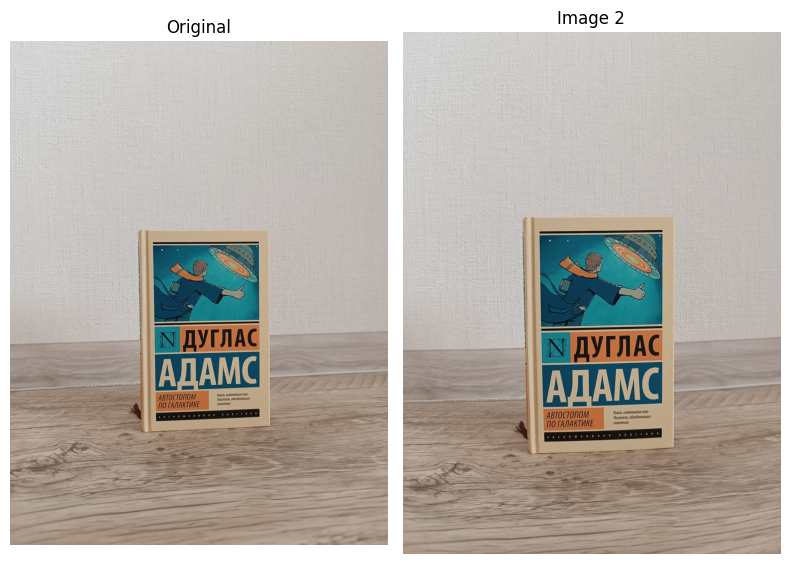

In [ ]:
def apply_undistortion(img, camera_matrix, dist_coeffs):
    h, w = img.shape[:2]

    new_camera_matrix, roi = cv.getOptimalNewCameraMatrix(
        camera_matrix, dist_coeffs, (w, h), 1, (w, h)
    )

    undistorted = cv.undistort(img, camera_matrix, dist_coeffs, None, new_camera_matrix)

    x, y, w, h = roi
    undistorted = undistorted[y:y+h, x:x+w]

    return undistorted

undis_img1 = apply_undistortion(img1, camera_matrix, dist_coeffs)
undis_img2 = apply_undistortion(img2, camera_matrix, dist_coeffs)

draw_compare(img1, undis_img1, 'Image 1')
draw_compare(img2, undis_img2, 'Image 2')

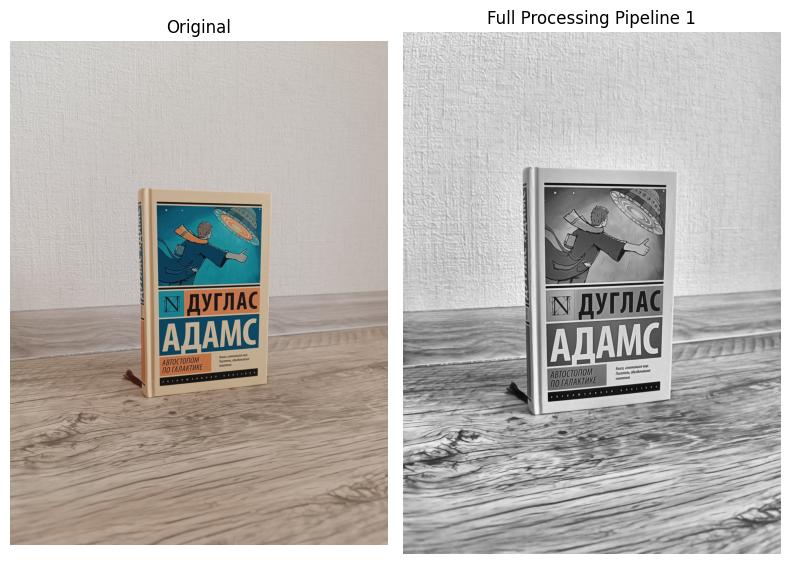

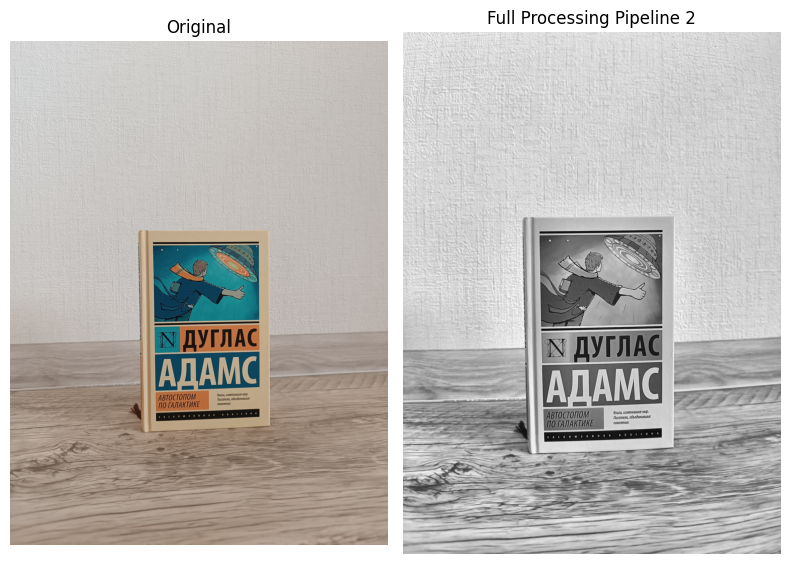

In [ ]:
def full_image_processing_pipeline(img, camera_matrix, dist_coeffs):

    undistorted = apply_undistortion(img, camera_matrix, dist_coeffs)

    denoised = cv.bilateralFilter(undistorted, 9, 75, 75)

    gray = cv.cvtColor(denoised, cv.COLOR_BGR2GRAY)
    clahe = cv.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    hist_corrected = clahe.apply(gray)

    def adjust_gamma(image, gamma=1.2):
        inv_gamma = 1.0 / gamma
        table = np.array([((i / 255.0) ** inv_gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
        return cv.LUT(image, table)

    gamma_corrected = adjust_gamma(hist_corrected)

    return gamma_corrected

processed1 = full_image_processing_pipeline(img1, camera_matrix, dist_coeffs)
processed2 = full_image_processing_pipeline(img2, camera_matrix, dist_coeffs)

draw_compare(img1, processed1, 'Full Processing Pipeline 1')
draw_compare(img2, processed2, 'Full Processing Pipeline 2')

=== ПОИСК КЛЮЧЕВЫХ ТОЧЕК РАЗНЫМИ МЕТОДАМИ ===
SIFT: найдено 9294 ключевых точек
ORB: найдено 500 ключевых точек
AKAZE: найдено 9846 ключевых точек
BRISK: найдено 7507 ключевых точек
SIFT: найдено 8282 ключевых точек
ORB: найдено 500 ключевых точек
AKAZE: найдено 7833 ключевых точек
BRISK: найдено 7370 ключевых точек

=== ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ ===

Детектор с наибольшим количеством точек: AKAZE (9846 точек)


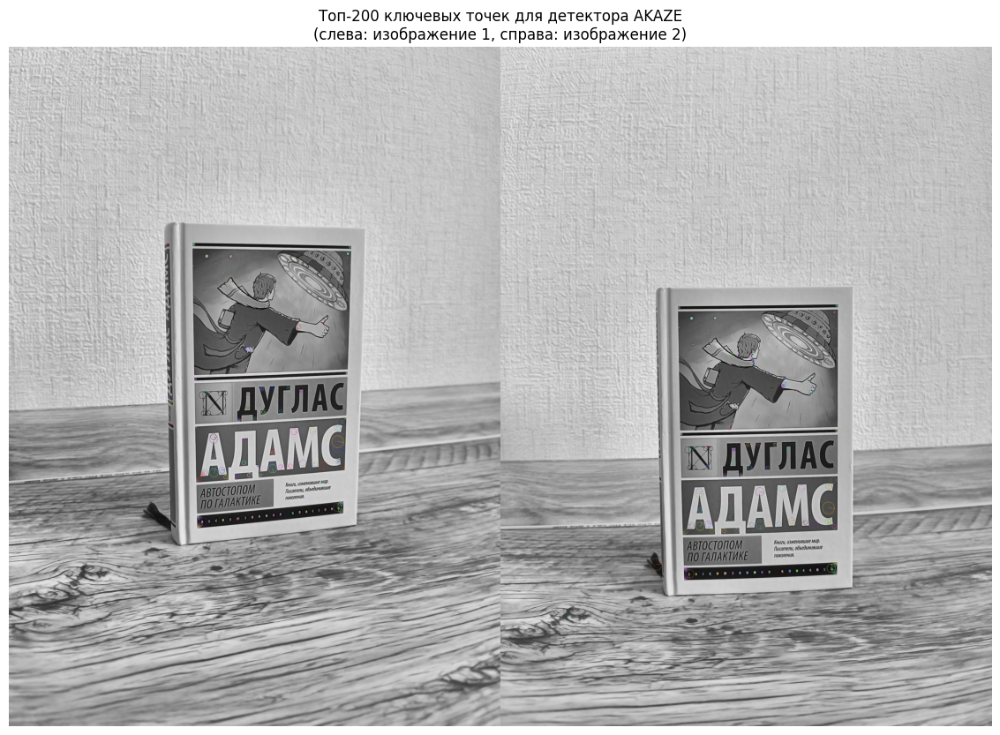

Лучший детектор: AKAZE
Топ-200 точек для изображения 1: 200
Топ-200 точек для изображения 2: 200


In [ ]:
def create_feature_detectors():
    detectors = {}
    detectors['SIFT'] = cv.SIFT_create()
    detectors['ORB'] = cv.ORB_create()
    detectors['AKAZE'] = cv.AKAZE_create()
    detectors['BRISK'] = cv.BRISK_create()
    return detectors

def detect_keypoints_with_various_methods(img):
    detectors = create_feature_detectors()
    results = {}

    for name, detector in detectors.items():
        try:
            keypoints, descriptors = detector.detectAndCompute(img, None)

            if keypoints is not None and descriptors is not None:
                results[name] = {
                    'keypoints': keypoints,
                    'descriptors': descriptors
                }
                print(f"{name}: найдено {len(keypoints)} ключевых точек")
            else:
                print(f"{name}: не удалось найти ключевые точки")

        except Exception as e:
            print(f"Ошибка в {name}: {e}")

    return results

def visualize_top_detector_features(img1, img2, features1, features2, top_points=200):
    max_detector = None
    max_points = 0

    for name, feature in features1.items():
        if len(feature['keypoints']) > max_points:
            max_points = len(feature['keypoints'])
            max_detector = name

    if max_detector is None:
        print("Не удалось найти детектор с ключевыми точками")
        return

    print(f"\nДетектор с наибольшим количеством точек: {max_detector} ({max_points} точек)")

    kp1 = features1[max_detector]['keypoints']
    kp2 = features2[max_detector]['keypoints']

    kp1_sorted = sorted(kp1, key=lambda x: -x.response)[:top_points]
    kp2_sorted = sorted(kp2, key=lambda x: -x.response)[:top_points]

    img1_with_kp = cv.drawKeypoints(img1, kp1_sorted, None,
                                   flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    img2_with_kp = cv.drawKeypoints(img2, kp2_sorted, None,
                                   flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    combined = np.hstack((img1_with_kp, img2_with_kp))
    plt.figure(figsize=(20, 10))
    plt.imshow(combined, cmap='gray')
    plt.title(f'Топ-{top_points} ключевых точек для детектора {max_detector}\n(слева: изображение 1, справа: изображение 2)')
    plt.axis('off')
    plt.show()

    return max_detector, kp1_sorted, kp2_sorted

print("=== ПОИСК КЛЮЧЕВЫХ ТОЧЕК РАЗНЫМИ МЕТОДАМИ ===")
features1 = detect_keypoints_with_various_methods(processed1)
features2 = detect_keypoints_with_various_methods(processed2)

print("\n=== ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ ===")
best_detector, top_kp1, top_kp2 = visualize_top_detector_features(processed1, processed2, features1, features2)

print(f"Лучший детектор: {best_detector}")
print(f"Топ-200 точек для изображения 1: {len(top_kp1)}")
print(f"Топ-200 точек для изображения 2: {len(top_kp2)}")

Найдено ключевых точек: img1 - 688, img2 - 628
Всего совпадений: 688
Хороших совпадений после ratio test: 402
Совпадений после RANSAC: 384
Точный процент ошибок: 4.48%


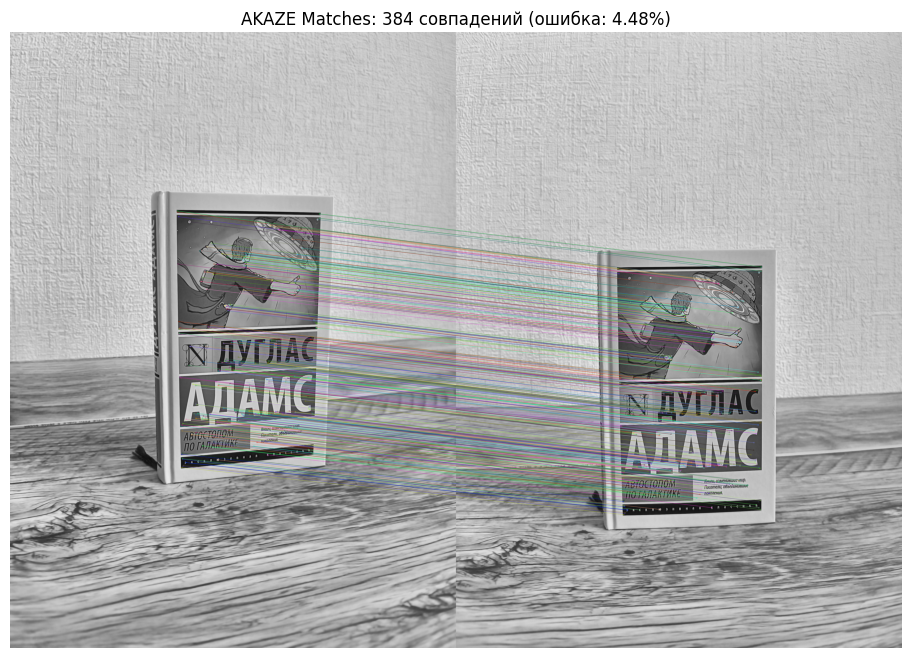

Всего совпадений: 688
После ratio test: 402
Финальное количество: 384
Процент ошибок: 4.48%
Цель достигнута: ошибки < 5%


In [ ]:
akaze = cv.AKAZE_create(
    descriptor_type=cv.AKAZE_DESCRIPTOR_MLDB,
    descriptor_size=0,
    threshold=0.008,
    nOctaves=8,
    nOctaveLayers=3
)

kp1, des1 = akaze.detectAndCompute(processed1, None)
kp2, des2 = akaze.detectAndCompute(processed2, None)

print(f"Найдено ключевых точек: img1 - {len(kp1)}, img2 - {len(kp2)}")
if des1 is not None and des2 is not None:
    bf = cv.BFMatcher(cv.NORM_HAMMING, crossCheck=False)
    matches = bf.knnMatch(des1, des2, k=2)
    good_matches = []
    all_matches = []
    for m, n in matches:
        all_matches.append(m)
        if m.distance < 0.7 * n.distance:
            good_matches.append(m)

    print(f"Всего совпадений: {len(all_matches)}")
    print(f"Хороших совпадений после ratio test: {len(good_matches)}")
    if len(good_matches) >= 4:
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
        M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)
        if mask is not None:
            final_matches = [good_matches[i] for i in range(len(good_matches)) if mask[i]]
            print(f"Совпадений после RANSAC: {len(final_matches)}")

            error_rate = (len(good_matches) - len(final_matches)) / len(good_matches) * 100
            print(f"Точный процент ошибок: {error_rate:.2f}%")

            if error_rate > 5 and len(final_matches) > 10:
                distances = [m.distance for m in final_matches]
                threshold_dist = np.percentile(distances, 95)
                optimal_matches = [m for m in final_matches if m.distance <= threshold_dist]
                final_matches = optimal_matches
                print(f"Совпадений после дополнительной фильтрации: {len(final_matches)}")
        else:
            final_matches = good_matches
            print("Не удалось вычислить гомографию")
    else:
        final_matches = good_matches
        print("Недостаточно совпадений для геометрической проверки")

    img_matches = cv.drawMatches(processed1, kp1, processed2, kp2, final_matches, None,
                               flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

    plt.figure(figsize=(15, 8))
    plt.imshow(img_matches)
    plt.title(f'AKAZE Matches: {len(final_matches)} совпадений (ошибка: {error_rate:.2f}%)')
    plt.axis('off')
    plt.show()

    print(f"Всего совпадений: {len(all_matches)}")
    print(f"После ratio test: {len(good_matches)}")
    print(f"Финальное количество: {len(final_matches)}")
    print(f"Процент ошибок: {error_rate:.2f}%")
    if error_rate <= 5:
        print("Цель достигнута: ошибки < 5%")
    else:
        print("Цель не достигнута")
else:
    print("Ошибка: не удалось вычислить дескрипторы для одного или обоих изображений")